<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction</a></span><ul class="toc-item"><li><span><a href="#Project-Summary" data-toc-modified-id="Project-Summary-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Project Summary</a></span></li><li><span><a href="#Project-Setup" data-toc-modified-id="Project-Setup-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Project Setup</a></span></li></ul></li><li><span><a href="#EDA" data-toc-modified-id="EDA-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>EDA</a></span><ul class="toc-item"><li><span><a href="#Data-Retrieval---Original-Data" data-toc-modified-id="Data-Retrieval---Original-Data-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Data Retrieval - Original Data</a></span></li><li><span><a href="#Data-Retrieval---Prepared-Data" data-toc-modified-id="Data-Retrieval---Prepared-Data-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Data Retrieval - Prepared Data</a></span></li><li><span><a href="#Exploring-Drivers-Dataset" data-toc-modified-id="Exploring-Drivers-Dataset-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Exploring Drivers Dataset</a></span></li><li><span><a href="#Exploring-Rides-Dataset" data-toc-modified-id="Exploring-Rides-Dataset-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Exploring Rides Dataset</a></span></li></ul></li><li><span><a href="#Average-Lifetime-Value-(ALTV)" data-toc-modified-id="Average-Lifetime-Value-(ALTV)-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Average Lifetime Value (ALTV)</a></span><ul class="toc-item"><li><span><a href="#Calculate-ALTV" data-toc-modified-id="Calculate-ALTV-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Calculate ALTV</a></span></li><li><span><a href="#Features-that-Impact-ALTV" data-toc-modified-id="Features-that-Impact-ALTV-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Features that Impact ALTV</a></span></li><li><span><a href="#Feature-Engineering" data-toc-modified-id="Feature-Engineering-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Feature Engineering</a></span></li><li><span><a href="#Feature-Scaling" data-toc-modified-id="Feature-Scaling-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Feature Scaling</a></span></li><li><span><a href="#Feature-Selection---VIF-Analysis" data-toc-modified-id="Feature-Selection---VIF-Analysis-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Feature Selection - VIF Analysis</a></span></li><li><span><a href="#Modeling" data-toc-modified-id="Modeling-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span>Modeling</a></span></li><li><span><a href="#Feature-Importance" data-toc-modified-id="Feature-Importance-3.7"><span class="toc-item-num">3.7&nbsp;&nbsp;</span>Feature Importance</a></span></li></ul></li><li><span><a href="#Average-Projected-Lifetime-of-a-driver?" data-toc-modified-id="Average-Projected-Lifetime-of-a-driver?-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Average Projected Lifetime of a driver?</a></span></li><li><span><a href="#Driver-Churn" data-toc-modified-id="Driver-Churn-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Driver Churn</a></span><ul class="toc-item"><li><span><a href="#Churn-rate" data-toc-modified-id="Churn-rate-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Churn rate</a></span></li><li><span><a href="#Predicting-Churn" data-toc-modified-id="Predicting-Churn-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Predicting Churn</a></span></li></ul></li><li><span><a href="#Driver-Segmentation" data-toc-modified-id="Driver-Segmentation-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Driver Segmentation</a></span><ul class="toc-item"><li><span><a href="#K---Means-Clustering" data-toc-modified-id="K---Means-Clustering-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>K - Means Clustering</a></span></li></ul></li><li><span><a href="#Competitor-Research" data-toc-modified-id="Competitor-Research-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Competitor Research</a></span></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></div>

In [1]:
%load_ext autoreload
%autoreload 2

In [4]:
# Imports

import pandas as pd
import numpy as np
import sqlite3
import os

from kiwi_ridesharing.data import Kiwi
from kiwi_ridesharing.drivers import Driver
from kiwi_ridesharing.ride import Ride

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn')

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import chart_studio.plotly as py

from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
from sklearn.metrics  import ConfusionMatrixDisplay
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn import preprocessing
from imblearn.over_sampling import RandomOverSampler
from sklearn.inspection import permutation_importance


pd.set_option('display.max_columns', None)

ModuleNotFoundError: No module named 'imblearn'

In [3]:
# set tick and lable sizes for all plt plots

SMALL_SIZE = 9
MEDIUM_SIZE = 12
BIGGER_SIZE = 15

plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

# Introduction

This notebook is part of a data analysis assignment given to me as part my interview process at Phiture. This notebook will document all the steps I took to prepare, clean, analyze and visualize the data.

## Project Summary

The goal of this assignment is to analyze data from a fictional ridesharing startup called Kiwi, which is based in New Zealand. Kiwi would like to grow in the competitive market and want us to help them answer important business questions and provide recommendations that could help them make appropriate business decisions.

## Project Setup

Kiwi gave us access to their data warehouse, which contains three tables:

- ride_ids
- driver_ids
- ride_timestamps

These CSV files were converted into a SQLite database using the [csvs-to-sqlite](https://pypi.org/project/csvs-to-sqlite/) package.

The basic project repository structure is shown below. 

- The data directory contains the created SQLite database as well as the raw CSV files. 
- The kiwi_ridesharing directory contains Python modules with Classes that handle the logic of data preperation for our project. Check the README.md file for more information on what each module does.
- The notebooks directory contains all the notebooks made for experimentation and data visulaization

# EDA

In this section i wills tart exploring the data and visualizing it in order to get a better understanding of it's distributions and trends, as well as to make sure that we have clean data that can be used to model our targets.


## Data Retrieval - Original Data


Lets start by looking at the raw data contained in the database and try to identify any anomalies or outliers.

In [4]:
root_dir = os.path.join(os.getcwd())
db_path = os.path.join(root_dir, "..", "kiwi_ridesharing", "data")

conn = sqlite3.connect(os.path.join(db_path, 'kiwi_datawarehouse.db'))
db = conn.cursor()

In [5]:
ride_ids_table = pd.read_sql('SELECT * FROM ride_ids', conn)
ride_timestamps_table = pd.read_sql('SELECT * FROM ride_timestamps', conn)
driver_ids_table = pd.read_sql('SELECT * FROM driver_ids', conn)

**ride_ids table**

In [6]:
ride_ids_table.head()

,driver_id,ride_id,ride_distance,ride_duration,ride_prime_time
0,002be0ffdc997bd5c50703158b7c2491,006d61cf7446e682f7bc50b0f8a5bea5,1811,327,50
1,002be0ffdc997bd5c50703158b7c2491,01b522c5c3a756fbdb12e95e87507eda,3362,809,0
2,002be0ffdc997bd5c50703158b7c2491,029227c4c2971ce69ff2274dc798ef43,3282,572,0
3,002be0ffdc997bd5c50703158b7c2491,034e861343a63ac3c18a9ceb1ce0ac69,65283,3338,25
4,002be0ffdc997bd5c50703158b7c2491,034f2e614a2f9fc7f1c2f77647d1b981,4115,823,100


In [7]:
ride_ids_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 193502 entries, 0 to 193501
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   driver_id        193502 non-null  object
 1   ride_id          193502 non-null  object
 2   ride_distance    193502 non-null  int64 
 3   ride_duration    193502 non-null  int64 
 4   ride_prime_time  193502 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 7.4+ MB


In [8]:
ride_ids_table.duplicated().sum()

0

The ride_ids table contains 193502 rows, no missing values and no duplicate values

**ride_timestamps_table**

In [9]:
ride_timestamps_table.head()

,ride_id,event,timestamp
0,00003037a262d9ee40e61b5c0718f7f0,requested_at,2016-06-13 09:39:19
1,00003037a262d9ee40e61b5c0718f7f0,accepted_at,2016-06-13 09:39:51
2,00003037a262d9ee40e61b5c0718f7f0,arrived_at,2016-06-13 09:44:31
3,00003037a262d9ee40e61b5c0718f7f0,picked_up_at,2016-06-13 09:44:33
4,00003037a262d9ee40e61b5c0718f7f0,dropped_off_at,2016-06-13 10:03:05


In [10]:
ride_timestamps_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970405 entries, 0 to 970404
Data columns (total 3 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   ride_id    970405 non-null  object
 1   event      970405 non-null  object
 2   timestamp  970404 non-null  object
dtypes: object(3)
memory usage: 22.2+ MB


In [11]:
ride_timestamps_table.duplicated().sum()

0

In [12]:
ride_timestamps_table[ride_timestamps_table["timestamp"].isnull()]

,ride_id,event,timestamp
434222,72f0fa0bd86800e9da5c4dced32c8735,arrived_at,None


The ride_ids table contains 970404 rows, 1 missing value and no duplicate values.

In [13]:
ride_timestamps_table[ride_timestamps_table["ride_id"] == "72f0fa0bd86800e9da5c4dced32c8735"]

,ride_id,event,timestamp
434220,72f0fa0bd86800e9da5c4dced32c8735,requested_at,2016-04-20 11:56:50
434221,72f0fa0bd86800e9da5c4dced32c8735,accepted_at,2016-04-20 11:57:20
434222,72f0fa0bd86800e9da5c4dced32c8735,arrived_at,None
434223,72f0fa0bd86800e9da5c4dced32c8735,picked_up_at,2016-04-20 12:02:20
434224,72f0fa0bd86800e9da5c4dced32c8735,dropped_off_at,2016-04-20 12:16:30


It seems that the arrived_at timestamp is missing, although all other timestamps of this ride are available. This could simply be a data entry mistake. One way to fill this value is by assuming that the arrived_at timestamp is the same as the picked_up timestamp.

**driver_ids table**

In [14]:
driver_ids_table.head()

,driver_id,driver_onboard_date
0,002be0ffdc997bd5c50703158b7c2491,2016-03-29 00:00:00
1,007f0389f9c7b03ef97098422f902e62,2016-03-29 00:00:00
2,011e5c5dfc5c2c92501b8b24d47509bc,2016-04-05 00:00:00
3,0152a2f305e71d26cc964f8d4411add9,2016-04-23 00:00:00
4,01674381af7edd264113d4e6ed55ecda,2016-04-29 00:00:00


In [15]:
driver_ids_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 937 entries, 0 to 936
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   driver_id            937 non-null    object
 1   driver_onboard_date  937 non-null    object
dtypes: object(2)
memory usage: 14.8+ KB


In [16]:
driver_ids_table.duplicated().sum()

0

The driver_ids table contains 937 rows, 0 missing value and no duplicate values.

Lets check how many unique driver ids and ride ids we have across all tables

In [17]:
driver_ids_total = driver_ids_table.merge(ride_ids_table, on="driver_id", how="outer")
driver_ids_total = driver_ids_total.drop_duplicates("driver_id")
driver_ids_total.head()

,driver_id,driver_onboard_date,ride_id,ride_distance,ride_duration,ride_prime_time
0,002be0ffdc997bd5c50703158b7c2491,2016-03-29 00:00:00,006d61cf7446e682f7bc50b0f8a5bea5,1811.0,327.0,50.0
277,007f0389f9c7b03ef97098422f902e62,2016-03-29 00:00:00,01f133164433ea7682545a41643e6949,4711.0,856.0,25.0
308,011e5c5dfc5c2c92501b8b24d47509bc,2016-04-05 00:00:00,0912947c9f3ff530407cd150a4cea97c,1148.0,223.0,0.0
342,0152a2f305e71d26cc964f8d4411add9,2016-04-23 00:00:00,014aa63435baaed30b21e12ae30f3797,2931.0,599.0,0.0
533,01674381af7edd264113d4e6ed55ecda,2016-04-29 00:00:00,010c383f0ad4203666b749a2e9f25069,972.0,282.0,0.0


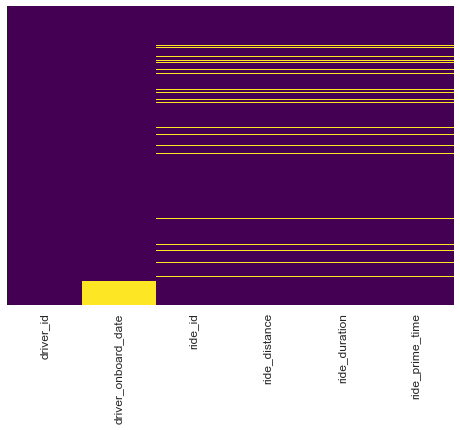

In [18]:
# check for missing values
sns.heatmap(driver_ids_total.isnull(),
        yticklabels=False,
        cbar=False,
        cmap='viridis')
plt.show()

In [19]:
driver_ids_total[(driver_ids_total["driver_onboard_date"].isnull()) |
                (driver_ids_total["ride_id"].isnull())]

,driver_id,driver_onboard_date,ride_id,ride_distance,ride_duration,ride_prime_time
908,01788cf817698fe68eaecd7eb18b2f72,2016-05-06 00:00:00,NaN,NaN,NaN,NaN
12145,133faf644d5cfee9460b87eea4367f92,2016-04-08 00:00:00,NaN,NaN,NaN,NaN
12526,13fe6713788e9b63f57950320f260512,2016-05-05 00:00:00,NaN,NaN,NaN,NaN
12551,146cd888491dd0f348575244f5bbc24e,2016-04-16 00:00:00,NaN,NaN,NaN,NaN
12625,1585fa96f0818e8f4d1cf826b332fda4,2016-05-06 00:00:00,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
193086,ec27575c98217627a852f24fe4233e5d,NaN,003b56a033448dc3b5094bfe3478f37e,1311.0,104.0,0.0
193200,f11a3563481c7bad15284e092daeb35f,NaN,01651ec7a6b3601214a3ca1296b73016,3900.0,469.0,25.0
193299,f361a3fa16afe27881749786b103ae25,NaN,065ee1554ec8ad5db897bbd687d80f41,1654.0,330.0,0.0
193370,ff1bb46e6b61766f4c7b9abd0a4ef9ac,NaN,00ed9f7dc5810fc14dd14d7459cf2efa,11410.0,1061.0,50.0


In total, we have 1020 unique driver id with 166 rows containing either missing on-boarding timestamp or ride timestamp. Both of these information will be important when trying to calculate Churn rate and Driver Lifetime Value. Ideally we should ask for more complete data or the reason behind the missing data but in this case its safer to drop these rows. 

## Data Retrieval - Prepared Data


**Using prepared data cleaning classes**

I prepared Python classes to take care of retrieving, joining and cleaning our data as well as some feature engineering to get more information out of the dataset.

From this point forwards we will be working with the pre-prepared data and using it in our analysis.

In [20]:
# get complete driver and rider data as well as the original CSV files
original_data = Kiwi().get_data()
drivers_clean = Driver().get_driver_training_data()
rides = Ride().get_full_rides_data()

## Exploring Drivers Dataset

This data set was created using the Driver class and contains different information regarding each driver id such as:

- **'driver_onboard_date'** -> Date of driver on-boarding
- **'first_ride'** --> Timestamp of first complete ride
- **'last_ride'** --> Timestamp of last completed ride
- **'is_churn'** --> 1 indicating that the driver has churned
- **'max_consecutive_offline'** --> Maximum number of consecutive days without driving
- **'last_online'**--> Days since last completed drive
- **'timestamp'** --> Timestamp of max consecutive days without ride
- **'last_online'** --> Number of days since last ride - relative to the maximum time period included in the dataset
- **'ride_count'** --> Total number of completed rides
- **'total_distance'** --> Total distance traveled
- **'total_driving_time'** --> Total driving time 
- **'total_earned'** --> Total earned
- **'prime_time_rides'**--> Number of completed primetime rides
- **'average_speed'**--> Average driving speed
- **'average_waittime'** --> Average time driver waited for rider in seconds
- **'average_response_time'** --> Average time for driver to confirm booking in seconds
- **'rides_weekday'** --> Number of rides on weekdays
- **'rides_weekend'** --> number of rides on weekends
- **'lifetime_in_days'** --> Number of days between on-boarding and churn date
- **'kiwi_average_monthly_revenue'** --> Average monthly revenue generated by driver for Kiwi
- **'average_lifetime_value'** --> Driver average lifetime value (ALTV)

In [21]:
drivers_clean.head()

,driver_id,driver_onboard_date,first_ride,last_ride,is_churn,max_consecutive_offline,last_online,ride_count,total_distance,total_driving_time,total_earned,prime_time_rides,average_speed,average_waittime,average_response_time,rides_weekday,rides_weekend,lifetime_in_days,kiwi_average_monthly_revenue,average_lifetime_value
0,002be0ffdc997bd5c50703158b7c2491,2016-03-29,2016-03-29 18:55:47,2016-06-23 10:29:53,0,8.0,3.0,277,1740.29,61.43,2923.29,110.0,24.111913,5.516245,8.407942,214.0,63.0,90.0,182.717500,548.152500
1,007f0389f9c7b03ef97098422f902e62,2016-03-29,2016-03-29 22:48:33,2016-06-22 13:28:38,0,16.0,4.0,31,117.53,5.65,265.30,12.0,20.516129,4.967742,11.838710,22.0,9.0,90.0,16.587500,49.762500
2,011e5c5dfc5c2c92501b8b24d47509bc,2016-04-05,2016-04-05 11:11:36,2016-06-12 20:30:38,1,17.0,14.0,34,269.65,8.13,395.70,16.0,25.323529,4.147059,7.294118,18.0,16.0,68.0,32.983333,74.762222
3,0152a2f305e71d26cc964f8d4411add9,2016-04-23,2016-04-25 16:21:24,2016-06-26 10:36:13,0,12.0,0.0,191,1471.24,48.50,2118.02,48.0,27.858639,10.952880,14.198953,152.0,39.0,65.0,176.513333,382.445556
4,01674381af7edd264113d4e6ed55ecda,2016-04-29,2016-04-29 08:14:54,2016-06-24 13:27:38,0,4.0,2.0,375,3123.64,99.28,4370.78,99.0,27.021333,8.256000,12.528000,375.0,0.0,59.0,364.230000,716.319000


In [22]:
drivers_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 837 entries, 0 to 936
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   driver_id                     837 non-null    object        
 1   driver_onboard_date           837 non-null    datetime64[ns]
 2   first_ride                    837 non-null    datetime64[ns]
 3   last_ride                     837 non-null    datetime64[ns]
 4   is_churn                      837 non-null    int64         
 5   max_consecutive_offline       837 non-null    float64       
 6   last_online                   837 non-null    float64       
 7   ride_count                    837 non-null    int64         
 8   total_distance                837 non-null    float64       
 9   total_driving_time            837 non-null    float64       
 10  total_earned                  837 non-null    float64       
 11  prime_time_rides              83

In [23]:
drivers_clean.describe(include='all', datetime_is_numeric=True)

,driver_id,driver_onboard_date,first_ride,last_ride,is_churn,max_consecutive_offline,last_online,ride_count,total_distance,total_driving_time,total_earned,prime_time_rides,average_speed,average_waittime,average_response_time,rides_weekday,rides_weekend,lifetime_in_days,kiwi_average_monthly_revenue,average_lifetime_value
count,837,837,837,837,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
unique,837,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,002be0ffdc997bd5c50703158b7c2491,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2016-04-19 00:20:38.709677568,2016-04-19 19:51:20.876941568,2016-06-13 17:58:11.185185024,0.307049,11.011947,12.927121,220.082437,1528.515938,52.564612,2437.566774,77.780167,26.286338,5.733109,11.910942,156.252091,63.830346,57.173238,228.824680,478.524687
min,NaN,2016-03-28 00:00:00,2016-03-28 06:37:51,2016-03-30 17:45:36,0.000000,0.000000,0.000000,3.000000,9.900000,0.480000,20.580000,0.000000,14.333333,1.482759,5.044444,0.000000,0.000000,1.000000,3.665000,1.727000
25%,NaN,2016-04-06 00:00:00,2016-04-06 22:08:46,2016-06-06 19:56:28,0.000000,5.000000,0.000000,44.000000,339.010000,10.620000,502.650000,13.000000,22.470833,2.541667,9.523810,33.000000,12.000000,45.000000,60.490000,78.284333
50%,NaN,2016-04-18 00:00:00,2016-04-19 09:28:16,2016-06-24 11:14:57,0.000000,8.000000,2.000000,224.000000,1451.390000,52.700000,2425.850000,72.000000,25.347500,4.256637,11.064516,152.000000,45.000000,60.000000,210.680000,470.325000
75%,NaN,2016-04-30 00:00:00,2016-05-01 01:56:58,2016-06-26 10:57:45,1.000000,14.000000,20.000000,330.000000,2311.850000,79.930000,3654.530000,119.000000,28.666667,7.942408,13.292419,245.000000,100.000000,75.000000,332.376667,726.390500
max,NaN,2016-05-15 00:00:00,2016-05-19 18:03:02,2016-06-27 00:50:50,1.000000,77.000000,88.000000,919.000000,6628.200000,216.570000,10108.260000,384.000000,49.675676,29.517241,41.250000,614.000000,373.000000,91.000000,1105.065000,2330.501667


In [24]:
# Plot timeseries of driver onboarding - number of drivers onboarded each day

num_onboarding = drivers_clean.groupby(drivers_clean["driver_onboard_date"].dt.date).count()[["driver_id"]]


fig = px.line(x=num_onboarding.index,y = num_onboarding['driver_id'],
              title='Number of On-Boarded Drivers',labels={'x': '', 'y':'On-boarded'})

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))


fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=25,tickangle = 45)
fig.update_yaxes(nticks=15, tickangle = 0)


fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))


fig.show()

In [25]:

# Ploty weekly onboarding vs weekly churn

driver_churn_monthly = drivers_clean.groupby(drivers_clean["last_ride"].dt.isocalendar().week).sum()[["is_churn"]]
driver_onboarding_monthly = drivers_clean.groupby(drivers_clean["driver_onboard_date"].dt.isocalendar().week).count()[["driver_id"]]


fig = make_subplots(specs=[[{"secondary_y": False}]])


# Add traces
fig.add_trace(
    go.Scatter(x=driver_churn_monthly.index, 
               y=driver_churn_monthly['is_churn'], 
               name="Churn"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=driver_onboarding_monthly.index,
               y=driver_onboarding_monthly['driver_id'],
               name="On-Boarded", 
               line = dict(width= 0.9)), secondary_y=False,           
)

# Add figure title
#fig.update_layout(title_text="")
# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.75
))
# Set x-axis title
fig.update_xaxes(title_text="Calendar Week 2021")
fig.update_yaxes(title_text="Count",secondary_y=False)

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=25,tickangle = 0)
fig.update_yaxes(nticks=15, tickangle = 0)


fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))
                 
fig.show()

In [26]:
# Distribution of total number of rides

fig = px.histogram(drivers_clean, x="ride_count",
                   nbins = 60,
                   title='Histogram of Number of Rides',
                   labels={'ride_count':'Number of Rides'})
fig.show()

We can see that the number of rides follows a Binomal distribution with two clear peaks. This indicates that we have two separate groups of drivers in our sample. Ones who tend to drive more often, and one who drive less. 

To better see the distribution of both these groups, lets separate them into two buckets, drivers with 120 or more rides, and drivers with less than 120.

In [27]:
fig = px.histogram(drivers_clean[drivers_clean["ride_count"] >= 120], x="ride_count",
                   nbins = 60,
                   title='Histogram of Number of Rides - 120 or more rides',
                   labels={'ride_count':'Number of Rides'})
fig.show()

In [28]:
fig = px.histogram(drivers_clean[drivers_clean["ride_count"] < 120], x="ride_count",
                   nbins = 25,
                   title='Histogram of Number of Rides - less than 120 rides',
                   labels={'ride_count':'Number of Rides'})
fig.show()

In [29]:
# Toal Rides on weekends vs weekdays




fig = go.Figure(data=[
    go.Bar(name='Weekday', y=[drivers_clean['rides_weekday'].sum()]),
    go.Bar(name='Weekend', y=[drivers_clean['rides_weekend'].sum()])
])


# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.72
))

fig.update_yaxes(title_text="Number of Completed Rides")

fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=1))

fig.update_xaxes(nticks=15,tickangle = 0)
fig.update_yaxes(nticks=15, tickangle = 0)

fig.show()

It seems that overall, there were more rides completed on weekdays than there were on the weekends. This is expected since people tend to commute more during the week to go to work and school for example. What would be interesting to see is whether the actual demand on weekdays is higher than on weekends, or whether there are simply more drivers active during weekdays. This will be further explored using the rides dataset

In [30]:
fig = px.histogram(drivers_clean, x="total_distance",
                   nbins = 60,
                   title='Histogram of Total Traveled',
                   labels={'total_distance':'Distance in km'})
fig.show()

Distance follows a similar distribution to number of rides. This is expected since less rides would mean less overall traveled distance and vice versa. 

In [31]:
fig = px.histogram(drivers_clean, x="average_speed",
                   nbins = 15,
                   title='Histogram of Average Driver Speed',
                   labels={'average_speed':'Speed in kmh'})
fig.show()

Average Driver speed seems to follow a normal distribution with a mean speed of around 26kmh. 

In [32]:
fig = px.histogram(drivers_clean, x="average_response_time",
                   nbins = 15,
                   title='Histogram of Average Driver Response Time',
                   labels={'average_response_time':'Response Time in Seconds'})
fig.show()

Most drivers respond to a booking request within the first 15 seconds. Meaning that on average the customer receives a quick confirmation of their ride.

In [33]:
# Days between onboarding and first ride

first_ride = drivers_clean[["driver_id", "driver_onboard_date", "first_ride"]]
first_ride["delta"] = (first_ride["first_ride"] - first_ride["driver_onboard_date"]).dt.days


fig = px.histogram(first_ride, x="delta",
                   nbins = 30,
                   title='Histogram of Days till First Ride',
                   labels={'delta':'Days'})
fig.show()

/var/folders/vp/w0q6bwv17zg47jg_mhc4nsdh0000gp/T/ipykernel_53684/3966975000.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Exploring Rides Dataset


In [34]:
rides.head()

,ride_id,requested_at,accepted_at,arrived_at,picked_up_at,dropped_off_at,ride_duration_minutes,ride_duration_hours,ride_distance,average_speed,driver_wait_time,customer_wait_time,driver_response_time,fare,ride_prime_time,is_prime_time
0,006d61cf7446e682f7bc50b0f8a5bea5,2016-04-23 02:13:50,2016-04-23 02:14:15,2016-04-23 02:16:36,2016-04-23 02:16:40,2016-04-23 02:22:07,5.0,0.0,1811,20.0,4.0,141.0,25.0,9.22,50,1
1,01b522c5c3a756fbdb12e95e87507eda,2016-03-29 19:00:49,2016-03-29 19:00:52,2016-03-29 19:03:57,2016-03-29 19:04:01,2016-03-29 19:17:30,13.0,0.0,3362,15.0,4.0,185.0,3.0,9.01,0,0
2,029227c4c2971ce69ff2274dc798ef43,2016-06-21 11:56:31,2016-06-21 11:56:39,2016-06-21 12:01:32,2016-06-21 12:01:35,2016-06-21 12:11:07,10.0,0.0,3282,21.0,3.0,293.0,8.0,8.30,0,0
3,034e861343a63ac3c18a9ceb1ce0ac69,2016-05-19 09:15:29,2016-05-19 09:15:33,2016-05-19 09:18:20,2016-05-19 09:18:20,2016-05-19 10:13:58,56.0,1.0,65283,70.0,0.0,167.0,4.0,78.40,25,1
4,034f2e614a2f9fc7f1c2f77647d1b981,2016-04-20 22:05:30,2016-04-20 22:05:32,2016-04-20 22:07:02,2016-04-20 22:07:02,2016-04-20 22:20:45,14.0,0.0,4115,18.0,0.0,90.0,2.0,19.54,100,1


In [35]:
rides.describe()

,ride_duration_minutes,ride_duration_hours,ride_distance,average_speed,driver_wait_time,customer_wait_time,driver_response_time,fare,ride_prime_time,is_prime_time
count,193502.000000,193502.000000,193502.000000,193502.000000,184819.000000,184819.000000,184819.000000,193502.000000,193502.000000,193502.000000
mean,14.315470,0.056935,6955.218266,25.410368,6.619861,250.636709,11.653715,13.840211,17.305893,0.351883
std,9.527489,0.236115,8929.444606,14.941621,13.894869,752.745133,36.465360,10.103497,30.825800,0.477559
min,0.000000,0.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.000000
25%,8.000000,0.000000,2459.000000,16.000000,1.000000,125.000000,5.000000,8.150000,0.000000,0.000000
50%,12.000000,0.000000,4015.000000,21.000000,3.000000,200.000000,6.000000,10.840000,0.000000,0.000000
75%,18.000000,0.000000,7193.000000,29.000000,4.000000,312.000000,9.000000,15.620000,25.000000,1.000000
max,470.000000,8.000000,724679.000000,148.000000,831.000000,86399.000000,5028.000000,624.990000,500.000000,1.000000


In [36]:
# Distribution of fare price
fig = px.histogram(rides, x="fare",
                   nbins = 60,
                   title='Histogram of Fare Price',
                   labels={'':''})
fig.show()

In [37]:
# Distribution of fare price

fig = px.histogram(rides, x=rides["ride_distance"]/1000,
                   nbins = 30,
                   title='Histogram of Ride Distance in km',
                   labels={'x':'distance in km'})
fig.show()

In [38]:
fig = px.histogram(rides, x="ride_duration_minutes",
                   nbins = 60,
                   title='Histogram of Ride Duration',
                   labels={'':''})
fig.show()

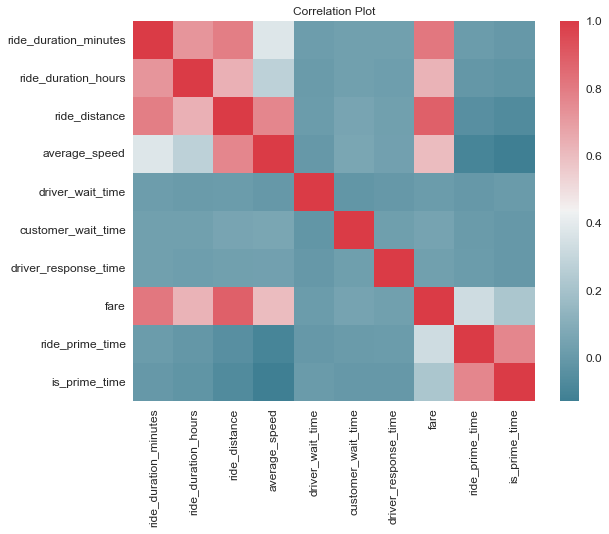

In [39]:
# heatmap
corr_df = rides.corr()
fig, ax =plt.subplots(figsize=(9, 7))
plt.title("Correlation Plot")
sns.heatmap(corr_df, cmap=sns.diverging_palette(220, 10, as_cmap=True),ax=ax)

#plt.savefig('Images/heatmap.png')
plt.show()

In [40]:
rides.head()

,ride_id,requested_at,accepted_at,arrived_at,picked_up_at,dropped_off_at,ride_duration_minutes,ride_duration_hours,ride_distance,average_speed,driver_wait_time,customer_wait_time,driver_response_time,fare,ride_prime_time,is_prime_time
0,006d61cf7446e682f7bc50b0f8a5bea5,2016-04-23 02:13:50,2016-04-23 02:14:15,2016-04-23 02:16:36,2016-04-23 02:16:40,2016-04-23 02:22:07,5.0,0.0,1811,20.0,4.0,141.0,25.0,9.22,50,1
1,01b522c5c3a756fbdb12e95e87507eda,2016-03-29 19:00:49,2016-03-29 19:00:52,2016-03-29 19:03:57,2016-03-29 19:04:01,2016-03-29 19:17:30,13.0,0.0,3362,15.0,4.0,185.0,3.0,9.01,0,0
2,029227c4c2971ce69ff2274dc798ef43,2016-06-21 11:56:31,2016-06-21 11:56:39,2016-06-21 12:01:32,2016-06-21 12:01:35,2016-06-21 12:11:07,10.0,0.0,3282,21.0,3.0,293.0,8.0,8.30,0,0
3,034e861343a63ac3c18a9ceb1ce0ac69,2016-05-19 09:15:29,2016-05-19 09:15:33,2016-05-19 09:18:20,2016-05-19 09:18:20,2016-05-19 10:13:58,56.0,1.0,65283,70.0,0.0,167.0,4.0,78.40,25,1
4,034f2e614a2f9fc7f1c2f77647d1b981,2016-04-20 22:05:30,2016-04-20 22:05:32,2016-04-20 22:07:02,2016-04-20 22:07:02,2016-04-20 22:20:45,14.0,0.0,4115,18.0,0.0,90.0,2.0,19.54,100,1


In [41]:
# Plot timeseries of number of rides per day

rides_per_day = rides.groupby(rides["dropped_off_at"].dt.date).count()[["ride_id"]]


fig = px.line(x=rides_per_day.index,y = rides_per_day['ride_id'],
              title='Number of Rides',labels={'x': '', 'y':'rides'})

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))


fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=25,tickangle = 45)
fig.update_yaxes(nticks=15, tickangle = 0)


fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))


fig.show()

In [42]:
# plot of prime time

primetime_hourly = rides.groupby([rides["requested_at"].dt.date, rides["requested_at"].dt.hour]).count()
primetime_hourly.index.rename(["date","hour"], inplace=True)
primetime_hourly = primetime_hourly.reset_index()
primetime_hourly = primetime_hourly.groupby(primetime_hourly["hour"]).mean()[["ride_id"]]

fig = px.line(x=primetime_hourly.index,y = primetime_hourly['ride_id'],
              title='Average Number of Requested Rides',labels={'x': 'Time of Day', 'y':'Requests'})

# Add figure title
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))


fig.update_yaxes(tickfont=dict(size=15))
fig.update_xaxes(tickfont=dict(size=15))

fig.update_xaxes(nticks=25,tickangle = 45)
fig.update_yaxes(nticks=15, tickangle = 0)


fig.update_xaxes(title_font=dict(size=18))
fig.update_yaxes(title_font=dict(size=18))


fig.show()

In [109]:
# number of rides per weekday

rides_dayofweek = rides.groupby(rides["requested_at"].dt.day_name()).count()[["ride_id"]]


fig = px.bar(rides_dayofweek,
             x=rides_dayofweek.index,
             y="ride_id",
             color=rides_dayofweek.index,
             title="NUmber of Rides per Weekday", 
             labels={'ride_id':'Total'})
fig.show()

# Average Lifetime Value (ALTV)

The Average Lifetime Value (ALTV) of a driver can be defined as:

**ALTV = Average lifetime of driver (time until they churn) x average revenue per driver by month**


**1. average revenue per driver by month**

A function from the Class Driver was prepared to do this calculation. It basically uses the ride_ids table along with the information provided by Kiwi to calculate the fare price per ride, which is defined as:

**fare = base_fare + distance_in_miles x cost_per_mile + ride_duration x cost_per_minute + service_fee**

If PrimeTime applies, then a percentage of the fare is added on top of the original cost.

Kiwi's monthly revenue from each driver was calculated as 20% of the monthly total sum of fares of the driver. 


**2. Average driver lifetime**

- **Churn date:** Is the date of their last ride of it was more than 14 days ago relative to the given dataset time period.
- **Driver lifetime:** This is defined as the number of days between onboarding and churn date

- **Average driver lifetime** = sum of all lifetimes / number of drivers


## Calculate ALTV

In [44]:
altv, df_ltv = Driver().get_lifetime_value()

In [45]:
print(f"The Average Lifetime Value of a Kiwi driver is: {round(altv, 2)} $")

The Average Lifetime Value of a Kiwi driver is: 454.66 $


## Features that Impact ALTV

In order to understand what the main factors are that contribute to the ALTV of every driver, we start by plotting the correlation between the altv per driver and other features in the drivers dataset.

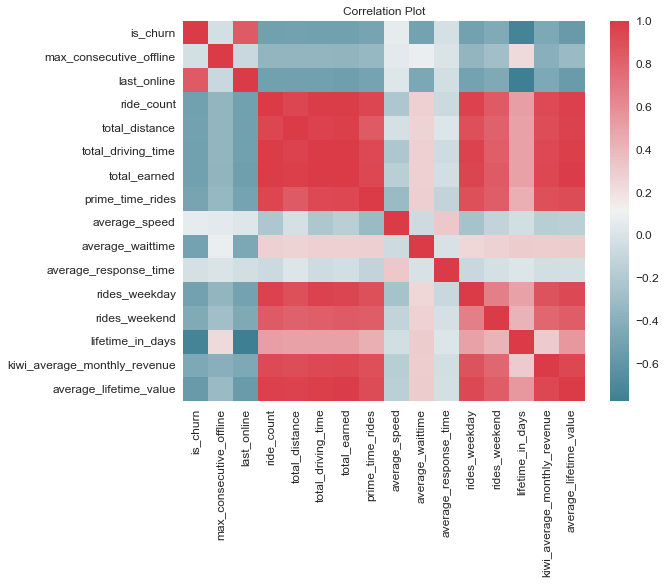

In [46]:
# heatmap
corr_df = drivers_clean.corr()
fig, ax =plt.subplots(figsize=(9, 7))
plt.title("Correlation Plot")
sns.heatmap(corr_df, cmap=sns.diverging_palette(220, 10, as_cmap=True),ax=ax)

#plt.savefig('Images/heatmap.png')
plt.show()

As we can see, we have a lot of variables which highly correlate with each other. This is expected since there is a lot of multicollinearity between these engineered variables. In order to get a better sense of the real correlation, let's convert count variable to ratios and clean up the data a bit. 

## Feature Engineering

In [47]:
# replace weekend and weekday ride count to percentages 

drivers_clean["pct_weekday"] = drivers_clean["rides_weekday"]/drivers_clean["ride_count"]
drivers_clean["pct_weekend"] = drivers_clean["rides_weekend"]/drivers_clean["ride_count"]

# average earned per ride
drivers_clean["earned_per_ride"] = drivers_clean["total_earned"]/drivers_clean["ride_count"]

# percentage of primetime rides
drivers_clean["pct_primetime"] = drivers_clean["prime_time_rides"]/drivers_clean["ride_count"]

# average number of rides per day
drivers_clean["rides_per_day"] = drivers_clean["ride_count"]/drivers_clean["lifetime_in_days"]

# days from onboarding till first ride
drivers_clean["delta_first_ride"] = (drivers_clean["first_ride"] - drivers_clean["driver_onboard_date"]).dt.days

drivers_clean["average_distance"] = drivers_clean["total_distance"] / drivers_clean["ride_count"]
drivers_clean["average_driving_time"] = drivers_clean["total_driving_time"] / drivers_clean["ride_count"]
drivers_clean["earned_per_day"] = drivers_clean["total_earned"] / drivers_clean["lifetime_in_days"]

# number of rides within first 14 days
first_14_days = Driver().get_rides_first_14_days()
drivers_clean = drivers_clean.merge(first_14_days, on="driver_id", how="left")

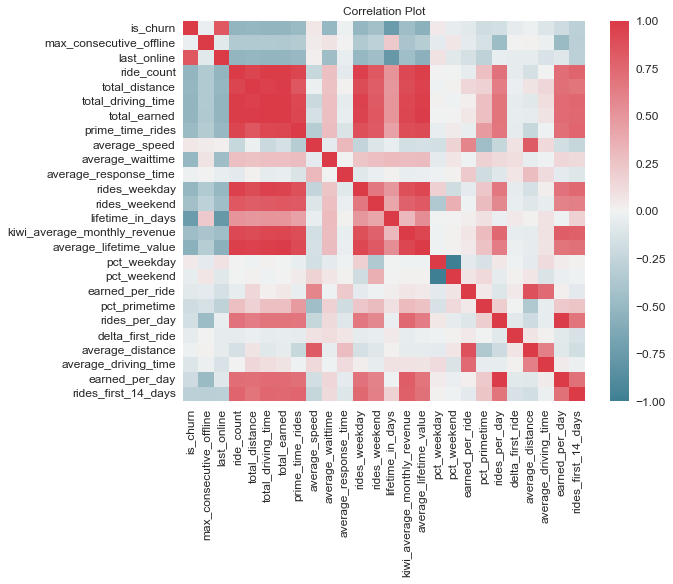

In [48]:
# heatmap
corr_df = drivers_clean.corr()
fig, ax =plt.subplots(figsize=(9, 7))
plt.title("Correlation Plot")
sns.heatmap(corr_df, cmap=sns.diverging_palette(220, 10, as_cmap=True),ax=ax)

#plt.savefig('Images/heatmap.png')
plt.show()

## Feature Scaling
In order to understand the true impact of each feature on ALTV, we first have to scale our data.

- Features with large magnitudes can incorrectly outweigh features of small magnitudes
- Scaling to smaller magnitudes improves computational efficiency
- Increases interpretability of feature coefficients

In [50]:
# keep only numerical columns
drivers_clean_num = drivers_clean.select_dtypes(include = ['number'])

y = drivers_clean_num["average_lifetime_value"]
X = drivers_clean_num.drop(["average_lifetime_value", "lifetime_in_days"], axis=1)

/var/folders/vp/w0q6bwv17zg47jg_mhc4nsdh0000gp/T/ipykernel_53684/3935304648.py:5: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



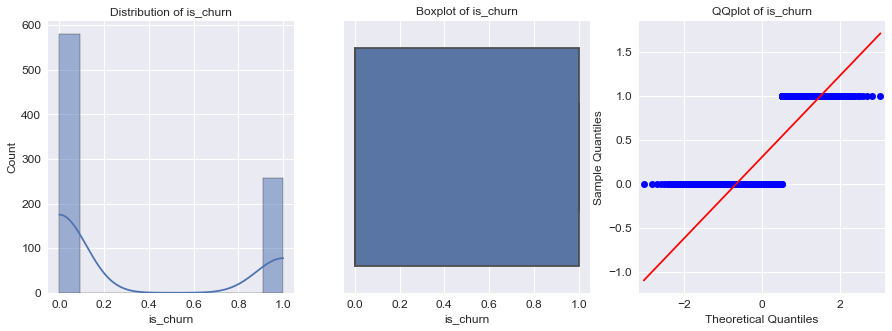

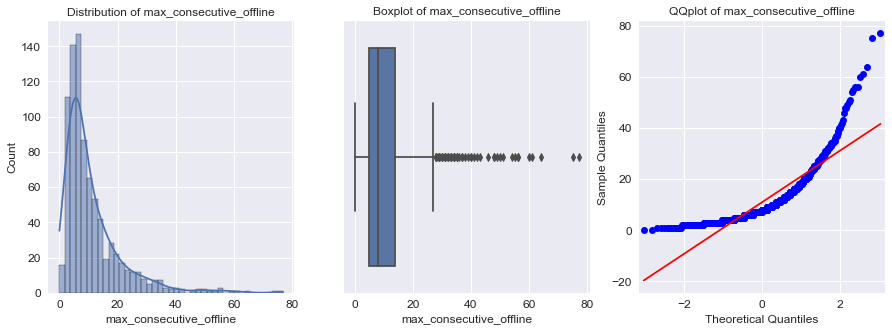

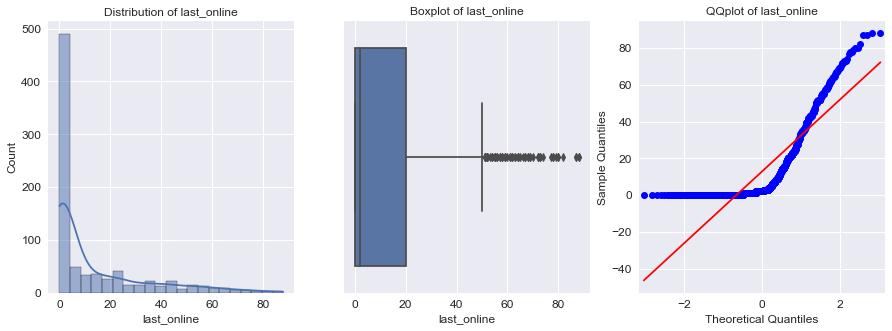

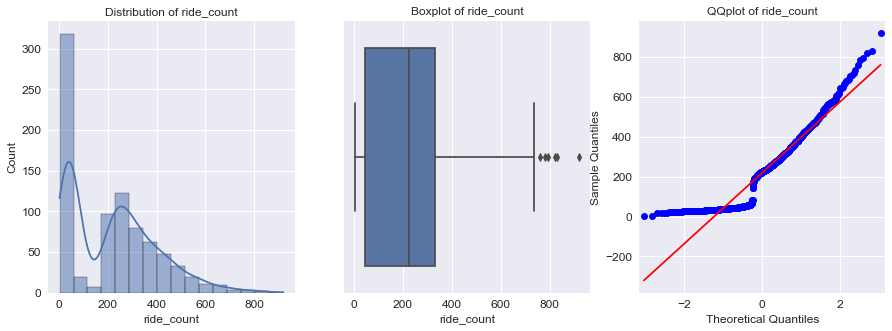

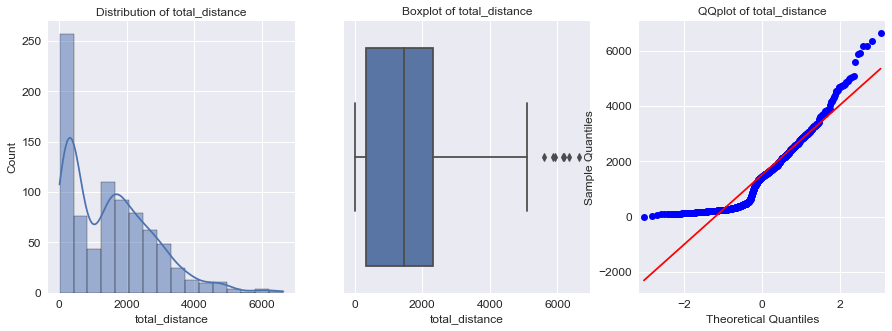

...

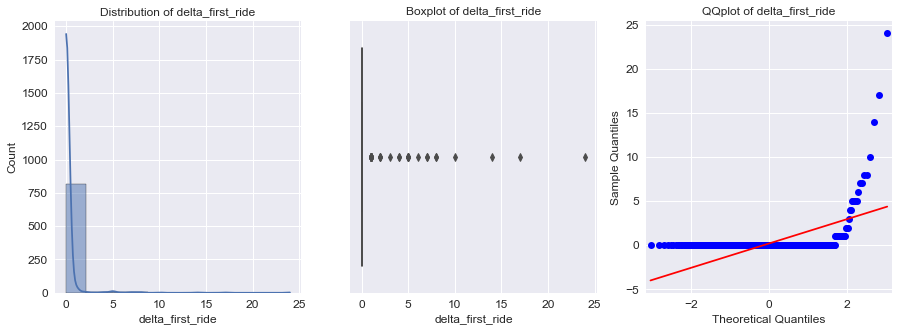

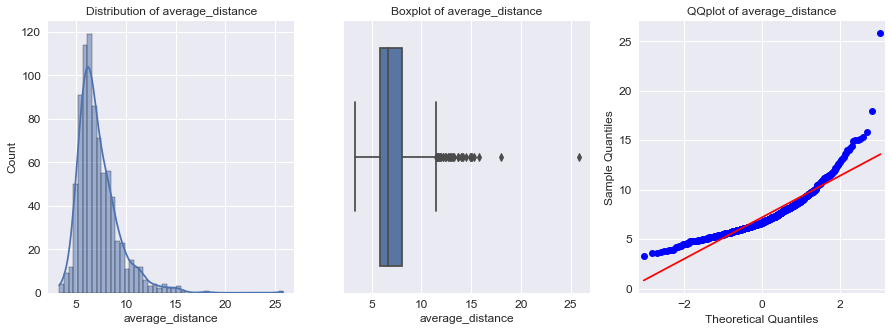

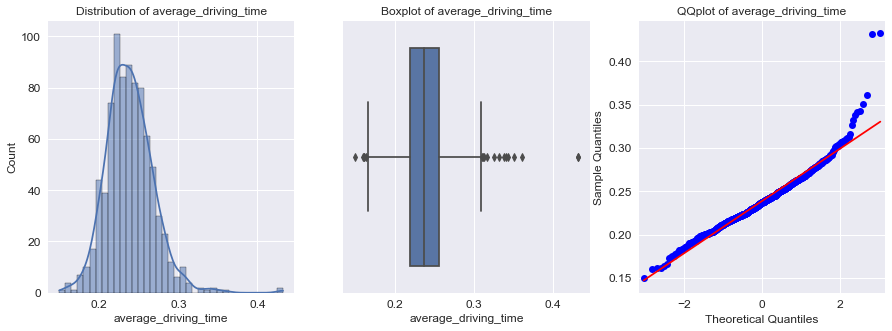

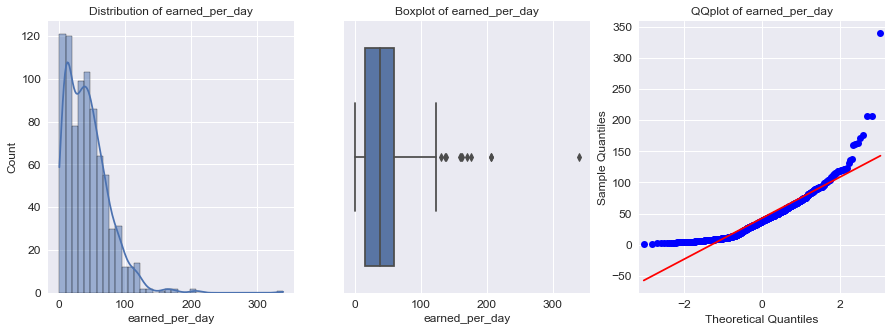

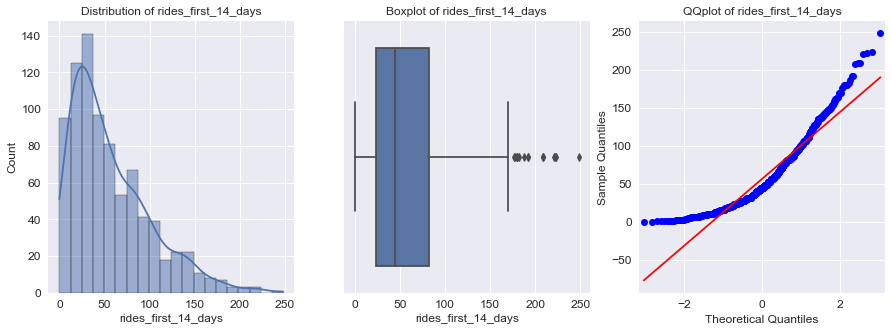

In [51]:
from statsmodels.graphics.gofplots import qqplot

for feature in X.columns:
    
    fig, ax = plt.subplots(1,3, figsize = (15,5))
    
    ax[0].set_title(f"Distribution of {feature}")
    sns.histplot(x = X[feature], kde = True, ax = ax[0])
    
    ax[1].set_title(f"Boxplot of {feature}")
    sns.boxplot(x = X[feature], ax = ax[1])
    
    ax[2].set_title(f"QQplot of {feature}")
    qqplot(X[feature], line='s', ax = ax[2])

Most of the features are normally distributed with outliers, therefore some appropriate scaling methods could Standardization and Robust Scaling, which removes the median and scales the data according to the quantile range. 

In [52]:
features_robust = ["max_consecutive_offline",
                   "last_online",
                   "average_response_time", "earned_per_ride"]

features_standard = ["average_speed", ""
                     "pct_primetime", "pct_weekday", "pct_weekend", "pct_primetime"
                     ]
features_minmax = ["ride_count",
                   "total_distance", "total_driving_time",
                   "total_earned", "prime_time_rides",
                   "rides_weekday", "rides_weekend",
                   "kiwi_average_monthly_revenue", "rides_per_day", "earned_per_day",
                   "average_waittime",
                   "delta_first_ride",
                   "rides_first_14_days"]

In [53]:
scalers = ColumnTransformer(
                        [
                            ("robust_scaler", RobustScaler(), features_robust),
                            ("standard_scaler", StandardScaler(), features_standard),
                            ("minmax_scaler", MinMaxScaler(), features_minmax)
                            
                        ])

scalers

ColumnTransformer(transformers=[('robust_scaler', RobustScaler(),
                                 ['max_consecutive_offline', 'last_online',
                                  'average_response_time', 'earned_per_ride']),
                                ('standard_scaler', StandardScaler(),
                                 ['average_speed', 'pct_primetime',
                                  'pct_weekday', 'pct_weekend',
                                  'pct_primetime']),
                                ('minmax_scaler', MinMaxScaler(),
                                 ['ride_count', 'total_distance',
                                  'total_driving_time', 'total_earned',
                                  'prime_time_rides', 'rides_weekday',
                                  'rides_weekend',
                                  'kiwi_average_monthly_revenue',
                                  'rides_per_day', 'earned_per_day',
                                  'average_waittime', 'delta_f

In [54]:
# SEPERATING THE DATASET INTO A TRAINING SET AND A TEST/EVALUATION SET
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.30,
                                                    random_state=1)

In [55]:
X_train_scaled = scalers.fit(X_train)
X_train_scaled = pd.DataFrame(scalers.transform(X_train))
X_test_scaled = pd.DataFrame(scalers.transform(X_test))

In [56]:
X_train_scaled.columns = features_robust + features_standard + features_minmax
X_test_scaled.columns = features_robust + features_standard + features_minmax
X_train_scaled

,max_consecutive_offline,last_online,average_response_time,earned_per_ride,average_speed,pct_primetime,pct_weekday,pct_weekend,pct_primetime,ride_count,total_distance,total_driving_time,total_earned,prime_time_rides,rides_weekday,rides_weekend,kiwi_average_monthly_revenue,rides_per_day,earned_per_day,average_waittime,delta_first_ride,rides_first_14_days
0,-0.444444,0.176471,0.126789,-0.069185,-0.736744,0.251230,0.672454,-0.672454,0.251230,0.741266,0.663432,0.779284,0.726107,0.673130,0.918567,0.316354,0.628952,0.239620,0.266330,0.176195,0.0,0.576613
1,0.222222,-0.058824,-0.440212,4.126331,1.923853,0.141876,-1.845311,1.845311,0.141876,0.031659,0.069447,0.048457,0.054263,0.030471,0.019544,0.053619,0.070645,0.016361,0.031435,0.173393,0.0,0.080645
2,-0.222222,-0.058824,0.716620,0.205917,-0.760286,0.443490,1.313653,-1.313653,0.443490,0.279476,0.268004,0.306984,0.286134,0.271468,0.397394,0.040214,0.247123,0.120219,0.139624,0.120090,0.0,0.286290
3,-0.111111,0.058824,-0.652756,0.508887,0.627549,-1.110190,1.357744,-1.357744,-1.110190,0.040393,0.046442,0.050447,0.043802,0.022161,0.061889,0.005362,0.036757,0.018151,0.022285,0.169157,0.0,0.064516
4,2.888889,0.352941,-0.424976,-0.972899,0.011132,-1.561820,-3.108995,3.108995,-1.561820,0.026201,0.021244,0.023742,0.021776,0.011080,0.006515,0.061662,0.028347,0.014848,0.014037,0.261537,0.0,0.072581
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
580,-0.111111,0.000000,2.840646,2.812253,3.290209,-1.239227,-0.530047,0.530047,-1.239227,0.055677,0.121253,0.070209,0.081430,0.027701,0.053746,0.056300,0.106020,0.023672,0.039190,0.060726,1.0,0.000000
581,0.444444,-0.117647,8.036965,1.157270,2.949907,-0.618855,-1.791748,1.791748,-0.618855,0.039301,0.061100,0.037025,0.046960,0.027701,0.024430,0.064343,0.061138,0.020632,0.027819,0.114486,0.0,0.036290
582,0.333333,0.058824,-0.355643,-0.454352,0.220852,0.152308,-0.518185,0.518185,0.152308,0.310044,0.255684,0.264822,0.284964,0.274238,0.286645,0.297587,0.371023,0.159741,0.166565,0.069035,0.0,0.516129
583,-0.555556,2.411765,0.748789,0.231779,0.030992,0.124649,1.095670,-1.095670,0.124649,0.255459,0.240928,0.249456,0.262630,0.224377,0.348534,0.061662,0.341952,0.232544,0.270980,0.044338,0.0,0.294355


## Feature Selection - VIF Analysis

VIF: Variance Inflation Factor

- A measure of the amount of multicolinearity per feature
- The higher, the more multicolinear, the less useful the feature with a high VIF
- Computed by regressing one feature as function of all others features and measuring R-squared


In [57]:
df_vif = pd.DataFrame()

df_vif["features"] = X_train_scaled.columns
df_vif["vif_index"] = [vif(X_train_scaled.values, i) for i in range(X_train_scaled.shape[1])]

round(df_vif.sort_values(by="vif_index", ascending = False),2)

/Users/Moe/.pyenv/versions/3.8.12/envs/lewagon/lib/python3.8/site-packages/statsmodels/stats/outliers_influence.py:193: RuntimeWarning:

divide by zero encountered in double_scalars



,features,vif_index
5,pct_primetime,inf
6,pct_weekday,inf
7,pct_weekend,inf
8,pct_primetime,inf
9,ride_count,87085.07
14,rides_weekday,43336.93
15,rides_weekend,8839.56
12,total_earned,1469.26
18,earned_per_day,324.32
17,rides_per_day,267.49


In [58]:
# remove all features with vif score > 15
features_remove = [feature for feature, vif in zip(df_vif["features"].values, df_vif["vif_index"].values) if vif >= 12]
X_train_scaled = X_train_scaled.drop(features_remove, axis=1)
X_test_scaled = X_test_scaled.drop(features_remove, axis=1)


In [59]:
X_train_scaled.columns

Index(['max_consecutive_offline', 'last_online', 'average_response_time',
       'earned_per_ride', 'average_speed', 'average_waittime',
       'delta_first_ride', 'rides_first_14_days'],
      dtype='object')

## Modeling

In [60]:
# INSTANTIATING THE MODEL TO CROSS-VALIDATE
model = LinearRegression()

# CROSS VALIDATING THE LOGISTIC REGRESSION
cv = cross_validate(model,
                    X_train_scaled,
                    y_train,
                    cv = 10) # usually 5 or 10 folds

# EVALUATING THE CROSS-VALIDATED MODEL
cv['test_score'].mean()

0.6480981678808317

In [61]:
# INSTANTIATING THE MODEL
model = LinearRegression()

# TRAINING THE MODEL ON... THE TRAINING SET
model.fit(X_train_scaled, y_train)

# EVALUATION
r2 = model.score(X_test_scaled, y_test)

print(f"r2 score is: {round(r2, 2)}")

r2 score is: 0.69


In [62]:
 model.coef_

array([ -78.27224294, -147.84944738,   -1.34819482,   18.59944985,
        -11.01637719,  153.186396  ,   59.48531487, 1191.8272807 ])

## Feature Importance
Perform feature permutation, and rank features by order of importance.

Feature permutation is a feature selection algorithm that evaluates the importance of each feature in predicting the target.

- Trains and records the test score of a base model containing all features
- Randomly shuffles (permutation) a feature within the test set
- Records new score on shuffled test set
- Compares the new score to the original score
- Repeat for each feature


In [69]:
model = LinearRegression().fit(X_train_scaled, y_train) # Fit model
permutation_score = permutation_importance(model, X_train_scaled, y_train, n_repeats=100) # Perform Permutation
importance_df = pd.DataFrame(np.vstack((X_train_scaled.columns,
                                        permutation_score.importances_mean)).T) # Unstack results

importance_df.columns=['feature','feature importance'] # Change column names

importance_df.sort_values(by="feature importance", ascending = False) # Order by importance

,feature,feature importance
7,rides_first_14_days,0.523064
1,last_online,0.294993
0,max_consecutive_offline,0.09073
5,average_waittime,0.005315
3,earned_per_ride,0.003612
4,average_speed,0.001342
6,delta_first_ride,0.000197
2,average_response_time,-0.000014


from the table above we can see that the features with highest predictive power are rides_first_14_days and last_online

# Average Projected Lifetime of a driver? 

In order to find this out, lets take a look a the distribution of the driver lifetime

In [70]:
# Distribution of total number of rides

fig = px.histogram(drivers_clean, x="lifetime_in_days",
                   nbins = 20,
                   title='Histogram of Driver Lifetime',
                   labels={'ride_count':'Days'})
fig.show()

As we can see, life time doesn't follow any particular distribution, therefore building a confidence interval would prove difficult.

Here we could leverage the power of the Central Limit Theorem which states that The means of random samples taken from a population converge toward a normal distribution with a standard deviation = **population std/sqrt(sample size)**

When estimating the mean of a population the CLT can be used to create a normal distribution based on n samples. The mean is then given as a confidence interval (mean of sample means +/- std).

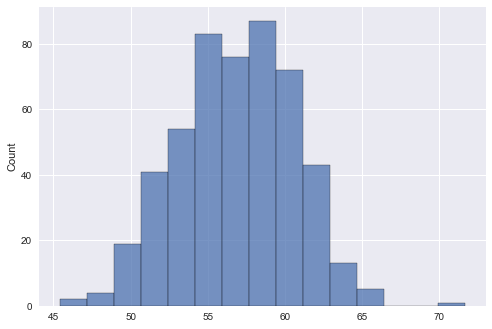

In [71]:
# drop null values
driver_lifetime = drivers_clean["lifetime_in_days"]

# n = sample size, N = number of samples
n = 30
N = 500
means = [driver_lifetime.sample(n, replace=True).mean() for i in range(N)]

sns.histplot(means, bins=15);

In general, under the assumption of normality, the confidence interval is given by:

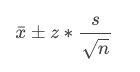

In [72]:
# Calculating the 95% confidence interval for average driver lifetime
z = 1.96 # z-score

mean = np.mean(means)

std = np.std(means)/ np.sqrt(30)

#95% Confidence Intervals
upper = mean + z*std
lower = mean - z*std

CI_95 = (np.round(lower), np.round(upper))
print(f'Estimate of Average Lifetime: {np.round(mean)}')
print(f'95% confidence interval for average driver lifetime in days: {CI_95}')

Estimate of Average Lifetime: 57.0
95% confidence interval for average driver lifetime in days: (56.0, 58.0)


# Driver Churn

Churn is defined as the rate at which drivers leave their jobs within a certain period - aka stop taking ride requests.

In order to properly determine how drivers churn, we must first define when a driver is considered to have churned. In most cases, a driver can be considered as churned when their last ride is dated 14 days or more before the day the data was pulled.

Our prepared drivers dataset already has column called is_churn, which indicates whether a driver has churned or not - i.e. hast not been active for the past 14 days

Lets pull up our rides data and check when the last recorded ride was (at the time of pulling the data from the database)

In [73]:
rides["dropped_off_at"].min()

Timestamp('2016-03-28 06:37:51')

In [74]:
rides["dropped_off_at"].max()

Timestamp('2016-06-27 00:50:50')

## Churn rate

Churn rate is the number of churned drivers divided by the examined period of time.

In [75]:
driver_churn = drivers_clean.copy()
driver_churn = driver_churn[~driver_churn["last_ride"].isnull()]

In [76]:
# number of total curned drivers
num_churned_drivers = driver_churn["is_churn"].sum()
total_number_of_drivers = len(driver_churn["driver_id"])

period_days = (rides["dropped_off_at"].max() - rides["dropped_off_at"].min()).days
period_weeks =  round(period_days/7)
period_months =  round(period_days/30)

In [77]:
print(f"Churn rate in {period_days} days is {round(num_churned_drivers/total_number_of_drivers, 2)}")

Churn rate in 90 days is 0.31


## Predicting Churn
This is a classification problem, since we are trying to predict whether a driver will churn or not.

In [78]:
# check class balance
driver_churn["is_churn"].value_counts()

0    580
1    257
Name: is_churn, dtype: int64

we can see that the classes are imbalanced. This can introduce bias to our model and must be corrected before continuing. 

In [79]:
driver_churn.columns

Index(['driver_id', 'driver_onboard_date', 'first_ride', 'last_ride',
       'is_churn', 'max_consecutive_offline', 'last_online', 'ride_count',
       'total_distance', 'total_driving_time', 'total_earned',
       'prime_time_rides', 'average_speed', 'average_waittime',
       'average_response_time', 'rides_weekday', 'rides_weekend',
       'lifetime_in_days', 'kiwi_average_monthly_revenue',
       'average_lifetime_value', 'pct_weekday', 'pct_weekend',
       'earned_per_ride', 'pct_primetime', 'rides_per_day', 'delta_first_ride',
       'average_distance', 'average_driving_time', 'earned_per_day',
       'rides_first_14_days'],
      dtype='object')

In [80]:
# define features
features = ['max_consecutive_offline',
            'average_speed',
            'average_waittime',
            'average_response_time',
            'average_distance',
            'average_driving_time',
            'pct_weekday',
            'pct_weekend',
            'earned_per_ride',
            'pct_primetime',
            'rides_per_day',
            'delta_first_ride',
            'rides_first_14_days']

In [81]:
# define target variable
y = drivers_clean["is_churn"]
# features
X = drivers_clean[features]

X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.30)

In [82]:
y_train.value_counts()

0    401
1    184
Name: is_churn, dtype: int64

In [83]:
# oversample trainng data
ros = RandomOverSampler(random_state=0)
ros.fit(X_train, y_train)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train, )

In [84]:
y_train_resampled.value_counts()

0    401
1    401
Name: is_churn, dtype: int64

In [85]:
# feature scaling
robust_scaler = RobustScaler()

# ROBUST SCALER
robust_scaler.fit(X_train_resampled)
X_train_scaled = robust_scaler.transform(X_train_resampled)
X_train_scaled = pd.DataFrame(X_train_scaled, columns = features)

# scale test set
X_test_scaled= robust_scaler.transform(X_test)

In [86]:
# INSTANTIATING THE MODEL TO CROSS-VALIDATE
logreg = LogisticRegression()

# CROSS VALIDATING THE LOGISTIC REGRESSION
logreg_cv = cross_validate(logreg, 
                           X_train_scaled, # features
                           y_train_resampled, # target
                           cv = 5,
                          scoring=["f1", "precision", "recall"]) 

# EVALUATING THE CROSS-VALIDATED MODEL
logreg_cv["test_f1"].mean()

0.8496291180647635

In [87]:
# build model

# INSTANTIATING THE MODEL
logreg = LogisticRegression(max_iter = 200)

# TRAINING THE MODEL ON... THE TRAINING SET
logreg.fit(X_train_scaled, y_train_resampled)

# EVALUATION
logreg.score(X_test_scaled, y_test)

/Users/Moe/.pyenv/versions/3.8.12/envs/lewagon/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names



0.8611111111111112

In [88]:
logreg.coef_[0][features.index("average_waittime")]

-2.808912919177621

Increasing waittime by 1 second decreases the log odds of churn by -3.38. 

Meaning that for each added second, the odds of driver churning decrease by exp(-3.38) = 0.034


In [89]:
y_pred = logreg.predict(X_test_scaled)

/Users/Moe/.pyenv/versions/3.8.12/envs/lewagon/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names



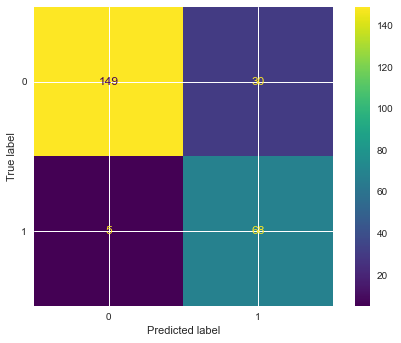

In [90]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

In [91]:
precision_score(y_test, y_pred) # It is important to be correct when identifying a class

NameError: name 'precision_score' is not defined

In [ ]:
recall_score(y_test, y_pred) # It is important to identify as many occurences of a class as possible

In [92]:
logreg.fit(X_train_scaled, y_train_resampled) # Fit model

permutation_score = permutation_importance(logreg,
                                           X_train_scaled,
                                           y_train_resampled,
                                           n_repeats=100) # Perform Permutation

importance_df = pd.DataFrame(np.vstack((X_train_scaled.columns,
                                        permutation_score.importances_mean)).T) # Unstack results

importance_df.columns=['feature','feature importance'] # Change column names
importance_df.sort_values(by="feature importance", ascending = False) # Order by importance

,feature,feature importance
2,average_waittime,0.271746
12,rides_first_14_days,0.056808
8,earned_per_ride,0.016259
5,average_driving_time,0.01606
9,pct_primetime,0.009888
4,average_distance,0.006808
11,delta_first_ride,0.004426
3,average_response_time,0.004102
6,pct_weekday,0.0
7,pct_weekend,0.0


# Driver Segmentation

In this section we will use clustering techniques in order to try and group drivers together based on their similarities.

<AxesSubplot:xlabel='average_lifetime_value', ylabel='earned_per_ride'>

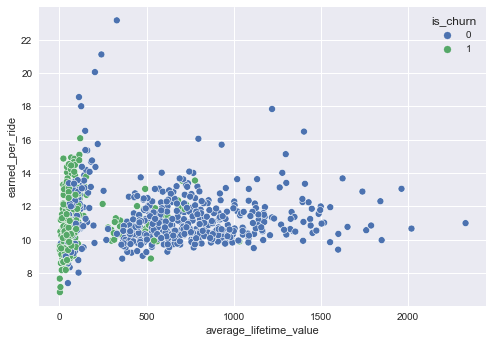

In [93]:
sns.scatterplot(x=drivers_clean["average_lifetime_value"], y=drivers_clean["earned_per_ride"], hue=drivers_clean["is_churn"])

<AxesSubplot:xlabel='average_lifetime_value', ylabel='max_consecutive_offline'>

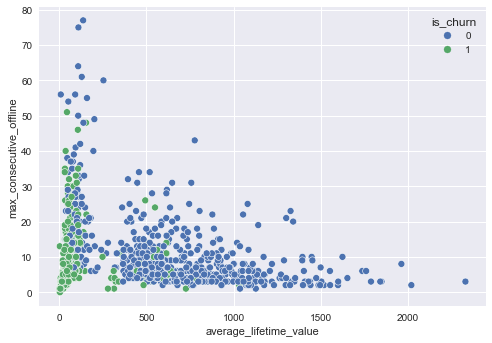

In [94]:
sns.scatterplot(x=drivers_clean["average_lifetime_value"], y=drivers_clean["max_consecutive_offline"], hue=drivers_clean["is_churn"])

<AxesSubplot:xlabel='ride_count', ylabel='total_distance'>

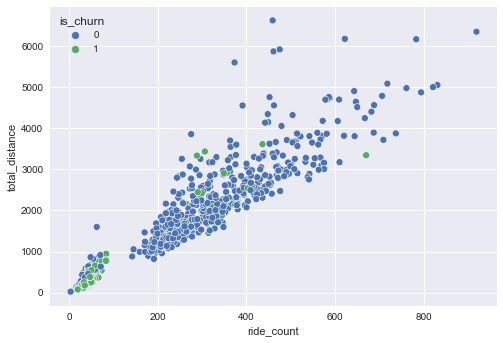

In [95]:
# Plot lifetime against avergae kwiw revenvue
sns.scatterplot(x=drivers_clean["ride_count"], y=drivers_clean["total_distance"], hue=drivers_clean["is_churn"])

From the plots above we can see that there seems to be a segmentation between drivers

## K - Means Clustering

In [96]:
drivers_num = drivers_clean.select_dtypes(include = ['number']) # selecting only the numerical features

features = drivers_num.drop("is_churn", axis=1).columns

# scale the data for better results
drivers_num_scaled = preprocessing.scale(drivers_num.drop("is_churn", axis=1))
drivers_num_scaled = pd.DataFrame(drivers_num_scaled, columns = features)


In [97]:
drivers_num.head()

,is_churn,max_consecutive_offline,last_online,ride_count,total_distance,total_driving_time,total_earned,prime_time_rides,average_speed,average_waittime,average_response_time,rides_weekday,rides_weekend,lifetime_in_days,kiwi_average_monthly_revenue,average_lifetime_value,pct_weekday,pct_weekend,earned_per_ride,pct_primetime,rides_per_day,delta_first_ride,average_distance,average_driving_time,earned_per_day,rides_first_14_days
0,0,8.0,3.0,277,1740.29,61.43,2923.29,110.0,24.111913,5.516245,8.407942,214.0,63.0,90.0,182.717500,548.152500,0.772563,0.227437,10.553394,0.397112,3.077778,0,6.282635,0.221769,32.481000,50.0
1,0,16.0,4.0,31,117.53,5.65,265.30,12.0,20.516129,4.967742,11.838710,22.0,9.0,90.0,16.587500,49.762500,0.709677,0.290323,8.558065,0.387097,0.344444,0,3.791290,0.182258,2.947778,2.0
2,1,17.0,14.0,34,269.65,8.13,395.70,16.0,25.323529,4.147059,7.294118,18.0,16.0,68.0,32.983333,74.762222,0.529412,0.470588,11.638235,0.470588,0.500000,0,7.930882,0.239118,5.819118,11.0
3,0,12.0,0.0,191,1471.24,48.50,2118.02,48.0,27.858639,10.952880,14.198953,152.0,39.0,65.0,176.513333,382.445556,0.795812,0.204188,11.089110,0.251309,2.938462,2,7.702827,0.253927,32.584923,42.0
4,0,4.0,2.0,375,3123.64,99.28,4370.78,99.0,27.021333,8.256000,12.528000,375.0,0.0,59.0,364.230000,716.319000,1.000000,0.000000,11.655413,0.264000,6.355932,0,8.329707,0.264747,74.081017,101.0


Text(0, 0.5, 'Within-cluster Sum of Squares')

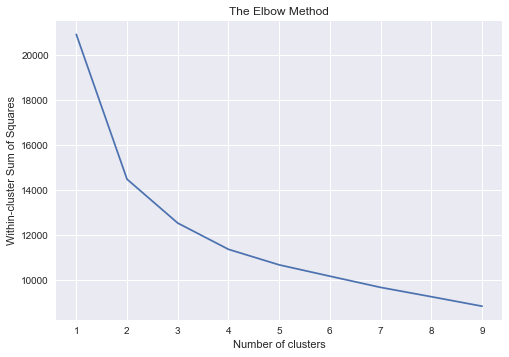

In [98]:
wcss = []

# cl_num' is a that keeps track the highest number of clusters we want to use the WCSS method for. 
cl_num = 10
for i in range (1,cl_num):
    kmeans= KMeans(i)
    kmeans.fit(drivers_num_scaled)
    wcss_iter = kmeans.inertia_
    wcss.append(wcss_iter)
wcss

number_clusters = range(1,cl_num)
plt.plot(number_clusters, wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Within-cluster Sum of Squares')

It looks like a 2 or 3 cluster solution is the best 

In [99]:
# initilize KMeans model with k=3 clusters
kmeans_scaled = KMeans(n_clusters = 3)
kmeans_scaled.fit(drivers_num_scaled)

KMeans(n_clusters=3)

In [100]:
labels_scaled = kmeans_scaled.labels_

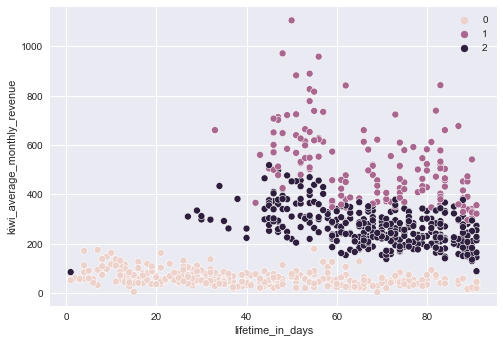

In [101]:
sns.scatterplot(x=drivers_num["lifetime_in_days"],
                y=drivers_num["kiwi_average_monthly_revenue"], hue=labels_scaled);

<AxesSubplot:xlabel='average_lifetime_value', ylabel='ride_count'>

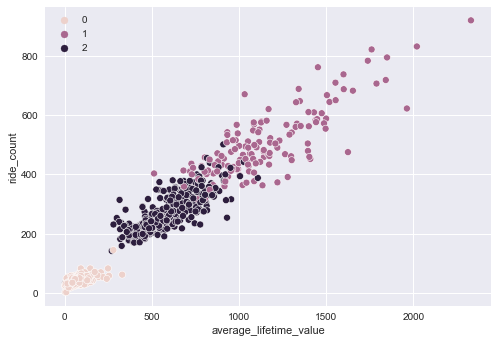

In [102]:
sns.scatterplot(x=drivers_num["average_lifetime_value"],
                y=drivers_num["ride_count"], hue=labels_scaled)

In [103]:
fig_scaled = px.scatter_3d(drivers_num,
                           x = 'lifetime_in_days',
                           y = 'rides_per_day',
                           z = 'earned_per_ride',
                           color = labels_scaled)
fig_scaled.show()

It seems that drivers can be segmented in 3 main groups.

The ones that are most important for Kiwi are those with high lifetime and high lifetime value and high ride count, meaning they are the ones who drive often and, consistently over a longer period of time (loyal and satisfied drivers). 

On the other hand, theres a group of drivers that neither drive often nor stay for long at kiwi, these are the alienated drivers that Kiwi should take steps to increase their engagement.

Finally, we have a group of drivers with a high lifetime and average revenue.

# Competitor Research

In order to understand where Kiwi fits in the New Zealand ridesharing market and help them grow, we must first identify competitors that operate in the same market.

Acoording to my research, there are 3 main ridesharing services currently operating in New Zealand:

- Uber
- Zoomy
- Ola

In [104]:
df_operators, geo_df = Kiwi().get_competitor_data()

In [105]:
df_operators.head()

,operator,driver_commision,base_fare,service_fee,cost_per_minute,cost_per_mile,min_fare
0,Uber,0.72,1.30,0.55,0.30,2.172614,6.50
1,Zoomy,0.85,1.20,1.00,0.30,2.092147,6.00
2,Ola,0.82,1.65,0.48,0.38,1.882932,5.81
3,Kiwi,0.80,2.00,1.75,0.22,1.150000,5.00


In [106]:
geo_df.head()

,name,lat,lon,operators,num_operators
0,Auckland,-36.848461,174.763336,"Uber, Ola, Zoomy",3
1,Christchurch,-43.525650,172.639847,"Uber, Ola, Zoomy",3
2,Dunedin,-45.878760,170.502798,"Uber, Ola",2
3,Hamilton,-37.783330,175.283330,"Uber, Ola",2
4,Napier-Hastings,-39.483330,176.916670,"Uber, Ola",2


In [107]:
# Plot service locations of competitors

ACCESS_TOEKN = "pk.eyJ1IjoibW9lMjIxIiwiYSI6ImNrem1zam4zeDJya24ydm8waW5pM2ppcTAifQ.wJbLVp14I9Wsuv-Pzla-zQ"

px.set_mapbox_access_token(ACCESS_TOEKN)
fig = px.scatter_mapbox(geo_df, lat="lat", lon="lon", color="operators", size="num_operators",
                  color_continuous_scale=px.colors.cyclical.IceFire, zoom=4)
fig.show()

In [108]:
# compare fare data
fig = px.bar(df_operators, x="operator", y=["driver_commision",
                                            "base_fare",
                                            "service_fee",
                                            "cost_per_minute",
                                            "cost_per_mile",
                                            "min_fare"], barmode="group")
fig.show()

# Conclusion

In this notebook we explored Kiwi's drivers and rides dataset and calculated different metrics including Average Driver Lifetime Value and Churn rate. 

**Average Life Time Value**

We found that the ALTV is around $454.66 per driver and that the features with the most impact on it is the number of completed rides within the first 14 days of on-boarding and the number of days since the driver was last seen online. 

This indicates that Kiwi should invest in their driver's experience, especially within the first 14 days and to check in on drivers who haven't been online for a consecutive number of days.

- Possible Experiment: 

Assumption: Newly onboarded drivers who receive more booking requests within the first two weeks will have a higher lifetime value.

Experiment group: Newly onboared drivers with more booking requests diverted to them
Control group: Newly onboarded drivers with standard booking request.


**Driver Churn**

We used Feature Engineering and a Logistic Regression model in order to try and predict whether a driver has churned or not with an f1-score of 0.89 and were able to identify that the average wait time until a customer shows up at pickup has the biggest effect on Churn. Surprisingly, longer average wait time decrease the chance of a driver churning.


**Driver Segmentation**

Finally we used clustering to segment drivers based on their features and came up with a 3 cluster solution to help Kiwi better understand what makes their drivers different and convert alienated drivers to more engaged and profitable ones.